In [ ]:
import numpy as np
from matplotlib import pyplot as plt
import pandas as pd
import seaborn as sns


In [ ]:
df=pd.read_csv('/content/Dataset .csv')

In [ ]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

In [ ]:
print(df.head())

   Restaurant ID         Restaurant Name  Country Code              City  \
0        6317637        Le Petit Souffle           162       Makati City   
1        6304287        Izakaya Kikufuji           162       Makati City   
2        6300002  Heat - Edsa Shangri-La           162  Mandaluyong City   
3        6318506                    Ooma           162  Mandaluyong City   
4        6314302             Sambo Kojin           162  Mandaluyong City   

                                             Address  \
0  Third Floor, Century City Mall, Kalayaan Avenu...   
1  Little Tokyo, 2277 Chino Roces Avenue, Legaspi...   
2  Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...   
3  Third Floor, Mega Fashion Hall, SM Megamall, O...   
4  Third Floor, Mega Atrium, SM Megamall, Ortigas...   

                                     Locality  \
0   Century City Mall, Poblacion, Makati City   
1  Little Tokyo, Legaspi Village, Makati City   
2  Edsa Shangri-La, Ortigas, Mandaluyong City   
3      SM 

In [ ]:
num_rows, num_columns = df.shape

print("Number of rows:", num_rows)
print("Number of columns:", num_columns)


Number of rows: 9551
Number of columns: 21


In [ ]:
missing_values=df.isnull().sum()
print("Missing values in each column:")
print(missing_values)

Missing values in each column:
Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64


In [ ]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

from sklearn.preprocessing import OneHotEncoder

encoder = OneHotEncoder(handle_unknown='ignore')
encoded_data = encoder.fit_transform(df[['Cuisines']])
df['Cuisines'] = encoded_data.toarray()

imputer = IterativeImputer()
df['Cuisines'] = imputer.fit_transform(df[['Cuisines']])


In [ ]:
missing_values=df.isnull().sum()
print("Missing values in each column:")
print(missing_values)

Missing values in each column:
Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                0
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64


In [ ]:
print(df.dtypes)

Restaurant ID             int64
Restaurant Name          object
Country Code              int64
City                     object
Address                  object
Locality                 object
Locality Verbose         object
Longitude               float64
Latitude                float64
Cuisines                float64
Average Cost for two      int64
Currency                 object
Has Table booking        object
Has Online delivery      object
Is delivering now        object
Switch to order menu     object
Price range               int64
Aggregate rating        float64
Rating color             object
Rating text              object
Votes                     int64
dtype: object


<ipython-input-10-2a74d7692027>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Restaurant Name', data=df, palette='Set2')


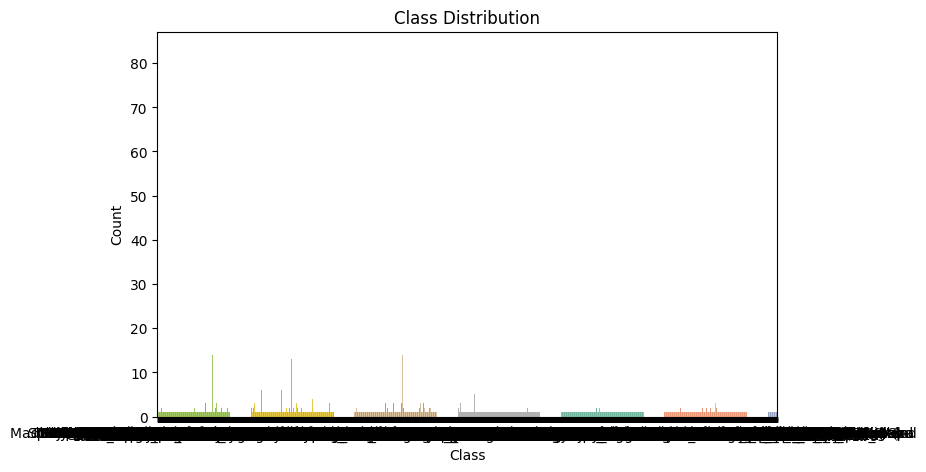

Class Proportions:
Restaurant Name
Cafe Coffee Day             0.008690
Domino's Pizza              0.008271
Subway                      0.006596
Green Chick Chop            0.005340
McDonald's                  0.005026
                              ...   
Odeon Social                0.000105
Johnny Rockets              0.000105
House of Commons            0.000105
HotMess                     0.000105
Walter's Coffee Roastery    0.000105
Name: count, Length: 7446, dtype: float64
Class Imbalance Score: 0.012048192771084338


In [ ]:
class_counts = df['Restaurant Name'].value_counts()

plt.figure(figsize=(8, 5))
sns.countplot(x='Restaurant Name', data=df, palette='Set2')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.show()


class_proportions = class_counts / class_counts.sum()


print("Class Proportions:")
print(class_proportions)

class_imbalance_score = class_proportions.min() / class_proportions.max()
print("Class Imbalance Score:", class_imbalance_score)

In [ ]:
#Level 1 Task 2

In [ ]:
numerical_columns = df.select_dtypes(include=['number'])

print("Numerical Columns:")
print(numerical_columns.columns)

Numerical Columns:
Index(['Restaurant ID', 'Country Code', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Price range', 'Aggregate rating', 'Votes'],
      dtype='object')


In [ ]:
numerical_df=pd.DataFrame(numerical_columns)
mean_value=numerical_df.mean()
median_value=numerical_df.median()
standard_deviation_value=numerical_df.std()


print('Mean Values:')
print(mean_value)
print('\nMedian Values:')
print(median_value)
print('\nStandard Deviation Values:')
print(standard_deviation_value)

Mean Values:
Restaurant ID           9.051128e+06
Country Code            1.836562e+01
Longitude               6.412657e+01
Latitude                2.585438e+01
Cuisines                4.188043e-04
Average Cost for two    1.199211e+03
Price range             1.804837e+00
Aggregate rating        2.666370e+00
Votes                   1.569097e+02
dtype: float64

Median Values:
Restaurant ID           6.004089e+06
Country Code            1.000000e+00
Longitude               7.719196e+01
Latitude                2.857047e+01
Cuisines                0.000000e+00
Average Cost for two    4.000000e+02
Price range             2.000000e+00
Aggregate rating        3.200000e+00
Votes                   3.100000e+01
dtype: float64

Standard Deviation Values:
Restaurant ID           8.791521e+06
Country Code            5.675055e+01
Longitude               4.146706e+01
Latitude                1.100794e+01
Cuisines                2.046149e-02
Average Cost for two    1.612118e+04
Price range             9

<ipython-input-13-30bb084dce61>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=category_counts.index, y=category_counts.values, palette='viridis')


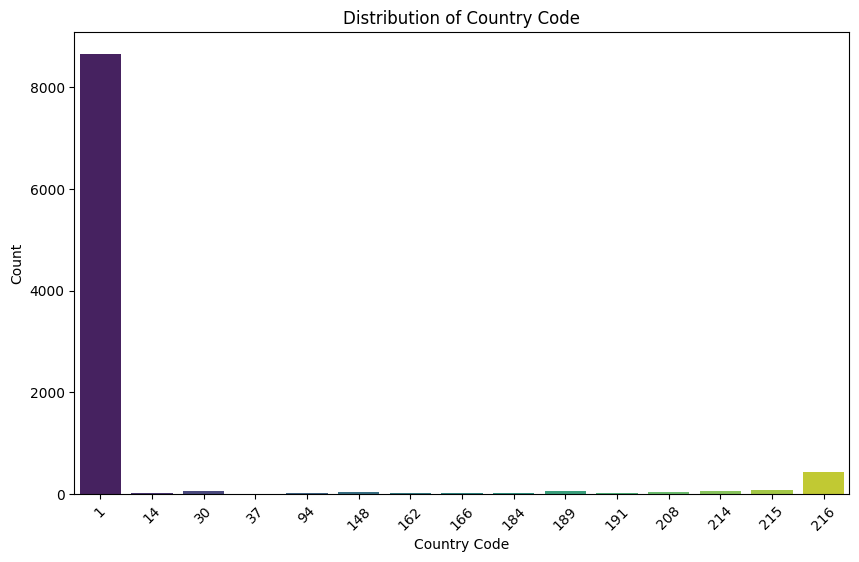

In [ ]:
categorical_column = 'Country Code'


category_counts = df[categorical_column].value_counts()


plt.figure(figsize=(10, 6))
sns.barplot(x=category_counts.index, y=category_counts.values, palette='viridis')
plt.title('Distribution of ' + categorical_column)
plt.xlabel(categorical_column)
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()


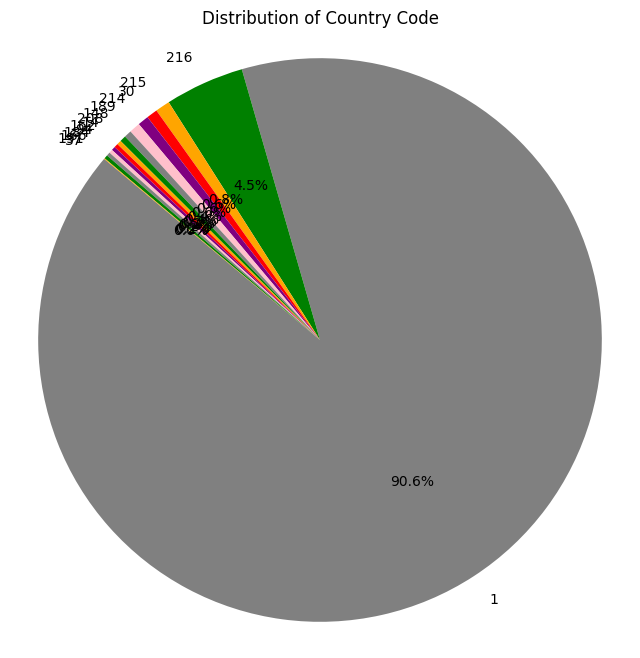

In [ ]:
custom_colors = ['gray', 'green', 'orange', 'red', 'purple', 'pink']

plt.figure(figsize=(8, 8))
plt.pie(category_counts, labels=category_counts.index, autopct='%1.1f%%', startangle=140, colors=custom_colors)
plt.title('Distribution of ' + categorical_column)
plt.axis('equal')
plt.show()

<ipython-input-15-cd55ee7e48a6>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=category_counts.index, y=category_counts.values, palette='viridis')


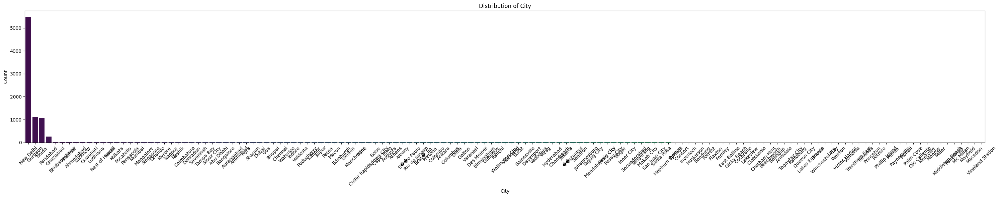

In [ ]:
categorical_column = 'City'


category_counts = df[categorical_column].value_counts()


plt.figure(figsize=(30, 6))
sns.barplot(x=category_counts.index, y=category_counts.values, palette='viridis')
plt.title('Distribution of ' + categorical_column)
plt.xlabel(categorical_column)
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


<ipython-input-16-10a76208c4e1>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=category_counts.index, y=category_counts.values, palette='viridis')


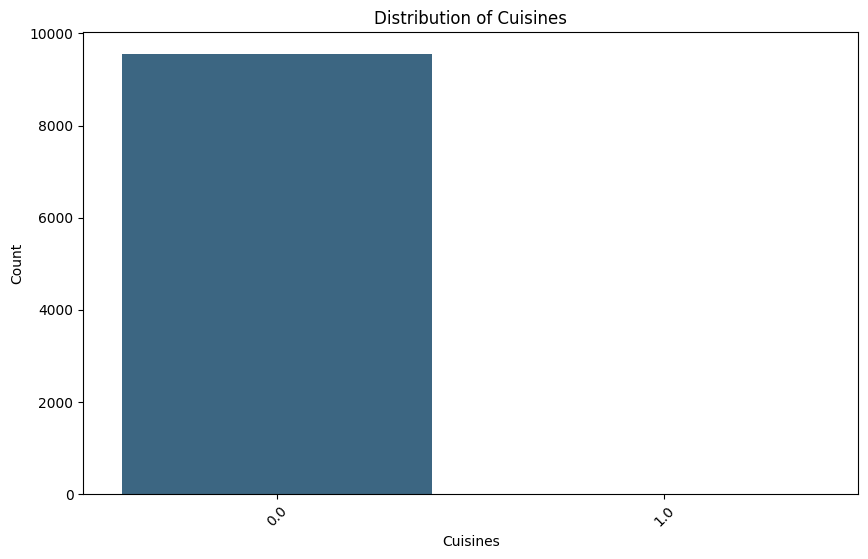

In [ ]:
categorical_column = 'Cuisines'


category_counts = df[categorical_column].value_counts()


plt.figure(figsize=(10, 6))
sns.barplot(x=category_counts.index, y=category_counts.values, palette='viridis')
plt.title('Distribution of ' + categorical_column)
plt.xlabel(categorical_column)
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()


In [ ]:
df['Cuisines'] = df['Cuisines'].astype(str)
cuisine_counts = df['Cuisines'].str.split(', ', expand=True).stack().value_counts()


city_counts = df['City'].value_counts()


print("Top Cuisines:")
print(cuisine_counts.head(10))

print("\nTop Cities:")
print(city_counts.head(10))

Top Cuisines:
0.0    9547
1.0       4
Name: count, dtype: int64

Top Cities:
City
New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
Bhubaneshwar      21
Amritsar          21
Ahmedabad         21
Lucknow           21
Guwahati          21
Name: count, dtype: int64


In [ ]:
#Level 1 Task 3

In [ ]:
import folium
m = folium.Map(location=[28.7041, 77.1025], zoom_start=12)

for index, row in df.iterrows():
    folium.Marker([row['Latitude'], row['Longitude']], popup=row['Restaurant Name']).add_to(m)

m


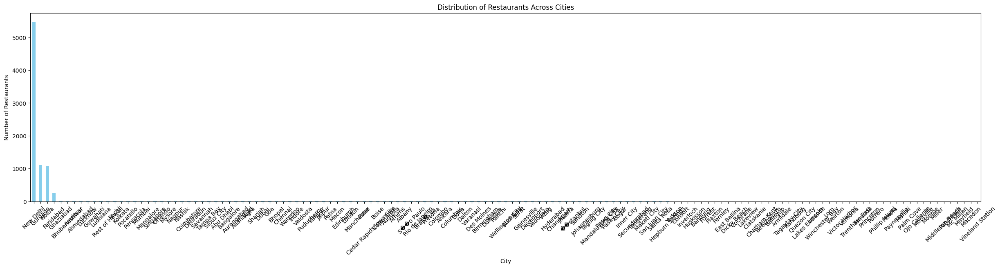

In [ ]:
restaurant_counts = df['City'].value_counts()
# restaurant_counts = df['Country'].value_counts()  # For countries

plt.figure(figsize=(30, 6))
restaurant_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Restaurants Across Cities')
# plt.title('Distribution of Restaurants Across Countries')
plt.xlabel('City')  # Or 'Country' for countries
plt.ylabel('Number of Restaurants')
plt.xticks(rotation=45)
plt.show()


In [ ]:
df["Rating text"].unique()


array(['Excellent', 'Very Good', 'Good', 'Average', 'Not rated', 'Poor'],
      dtype=object)

In [ ]:
correlation_matrix = df[['Latitude', 'Longitude', 'Aggregate rating']].corr()

print("Correlation Matrix:")
print(correlation_matrix)


correlation_lat_rating = correlation_matrix.loc['Latitude', 'Aggregate rating']
correlation_lon_rating = correlation_matrix.loc['Longitude', 'Aggregate rating']


print("\nCorrelation between Latitude and Rating:", correlation_lat_rating)
print("Correlation between Longitude and Rating:", correlation_lon_rating)

Correlation Matrix:
                  Latitude  Longitude  Aggregate rating
Latitude          1.000000   0.043207          0.000516
Longitude         0.043207   1.000000         -0.116818
Aggregate rating  0.000516  -0.116818          1.000000

Correlation between Latitude and Rating: 0.0005155806902363053
Correlation between Longitude and Rating: -0.11681757734540295
